# Simple MTG Algoritm and Data

This is a short independent project I pursued in my own time. The domain of this project relates to MTG, or Magic the Gathering, a collectible card game made by Wizards of the Coast. My simple exploratory data analytical question began with "how fast *can* a 'mono red aggro deck' win, and how fast should we **expect** it to win?" I began with a poor Naive game (V1.0), and did some simple data cleaning/analysis. Then I added some OOP to improve my reselts and data to better represent the game (V2.0). 
</br>
I sugguest, as a reader, you **skip and skim**  through what interests you. This is a bit lengthy to show how I began to proceed with the task, and some thoughts to teach myself for the future.

Sections include:
1. [V1.0: Functions - Simple Naive Game](#1-bullet)
2. [V1.0: MTG Data - Simple Naive Game](#2-bullet)
3. [MTG Algorithm V2.0: Game Class and Card Objects](#3-bullet)
4. [MTG Algorithm V2.0: Simple Exploratory Analysis](#4-bullet)

Some quick notes:
Running each cell isn't a problem, but I suggest simply skimming through the data sections.
</br>
I often have my functions defined with Python Docstrings (labelled INPUT, OUTPUT, Functionality, Limitations) if additional info is needed on the output or if the example is not clear.

In [1]:
#Importing
import numpy as np
import pandas as pd
import altair as alt
import random as rand

# V1.0: Functions - Naive Game <a class="anchor" id="1-bullet"></a> #

In [2]:
#The COSTS are for the CMC of the deck
deckCosts = [3,3,3,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

#Respective POWERS for creatures in deck
deckPowers = [4,4,4,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,2,2,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]

#The COSTS are for the CMC of the hand
handCost = []

#Respective POWERS for creatures in hand
handPowers = []

#An alternative way to hold the lists:
#deck = [deckCosts, deckPowers]
#Same applies for handCost and handPowers
#hand = [handCost, handPowers]

turn = 0
mana = 0

lifeTotal = 20
boardPowers = []



In [3]:
#Resets game and deck. 
#They are global, and python needs to indicate this (as opposed to Java). Classes are another future fix.
def resetGame():
    global turn, mana, lifeTotal, boardPowers, deckCosts, deckPowers, handCost, handPowers
    #This is useful at start of new games in succession.
    deckCosts = [3,3,3,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    deckPowers = [4,4,4,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,2,2,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    handCost = []
    handPowers = []
    
    turn = 0
    mana = 0
    
    lifeTotal = 20
    boardPowers = []



In [4]:
#testing the resetGame (1):
turn = 2
lifeTotal = -4
deckCosts = [3,3,3,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,1,1]
deckPowers = [4,4,4,3,3,3,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,1,1,1,1,2,2]
print(turn, lifeTotal, deckCosts, deckPowers)

2 -4 [3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1] [4, 4, 4, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2]


In [5]:
#testing the resetGame (2):
resetGame()

In [6]:
#testing the resetGame (3):
print(turn, lifeTotal, deckCosts, deckPowers)

0 20 [3, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] [4, 4, 4, 3, 3, 3, 0, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [7]:
#Shuffles the deck. We must keep the random states in coordination.
def shuffleDeck(a, b):
    """
    Input: Two lists.
    Output: two lists (randomized in relation to one another).
    Functionality: Randomizes two lists but keeps the index values of one tied to the other.
    """
    
    rng_state = np.random.get_state()
    np.random.shuffle(a)
    np.random.set_state(rng_state)
    np.random.shuffle(b)


In [8]:
#Testing shuffleDeck() (1):
print(deckCosts[0:10], deckPowers[0:10])
shuffleDeck(deckCosts, deckPowers)
print(deckCosts[0:10], deckPowers[0:10])

[3, 3, 3, 3, 3, 3, 0, 0, 0, 0] [4, 4, 4, 3, 3, 3, 0, 0, 0, 0]
[3, 2, 0, 2, 2, 0, 3, 0, 2, 2] [4, 2, 0, 2, 2, 0, 3, 0, 2, 2]


In [9]:
#Draws a card into the hand. Works as a STACK.
def drawCard():
    #Puts the top card into hand
    
    handCost.append(deckCosts[-1])
    handPowers.append(deckPowers[-1])
    #takes one off the deck STACK
    deckCosts.pop()
    deckPowers.pop()
    

In [10]:
#Testing Draw Card
resetGame()
shuffleDeck(deckCosts, deckPowers)
print(deckCosts[-1])
drawCard()
drawCard()
handPowers, handCost

2


([2, 0], [2, 0])

In [11]:
resetGame()

In [12]:
#plays a card from the hand onto the board

def playCard(manaCast):
    """
    Input: Converted Mana Cost of Card (CMC).
    Output: pops off the card from hand and adds to board
    Functionality: Note it finds the FIRST index of the given CMC
    """
    
    global mana
    
    cardToPlayIndex = handCost.index(manaCast)
    #play to board
    boardPowers.append(handPowers[cardToPlayIndex])
    #take out of hand
    handCost.pop(cardToPlayIndex)
    handPowers.pop(cardToPlayIndex)
    
    #subtract off the mana of the card
    mana = mana - manaCast


In [13]:
resetGame()
shuffleDeck(deckCosts, deckPowers)
for x in list(range(0,7)):
    drawCard()

handPowers, handCost


([2, 4, 0, 0, 0, 0, 1], [2, 3, 0, 0, 0, 0, 1])

In [14]:
#This is the first version of our Single Turn algorithm.....we can SUBSTANCIALLY improve this in MANY MANY ways logically and programattically.
#I used this first one as a way to troubleshoot as well.

def singleTurn():
    #upkeep
    drawCard()
    
    global turn, mana, lifeTotal
    turn += 1
    mana = turn
    
    #handCost = np.array(handCost)
    #minCMC = np.min(handCost[np.nonzero(handCost)])
    
    
    #Main Phase
    while(mana > 0):
        
        maxCMC = np.max(handCost)
        #print("maxCmC:",maxCMC)
        #print("mana:",mana)
        
        if (maxCMC != 0):
            
            minCMC = min(i for i in handCost if i > 0) 
            
            if (mana == maxCMC):
                print("Case 1 and is turn:",turn)
                playCard(maxCMC)
                maxCMC = np.max(handCost)
            
            
            elif(mana > maxCMC):
                print("Case2 and is turn:",turn)
                playCard(maxCMC)
                maxCMC = np.max(handCost)

                
            elif(mana < maxCMC and mana >= minCMC):
                print("Case 3")
                print("turn, mana",turn,mana)
                print("handCost",handCost)
                
                manaCountDown = mana
                for i in range(mana, 0, -1):
                    manaCountDown = i
                    print("manaCountDown",manaCountDown)
                    
                    if(manaCountDown in handCost):
                        
                        
                        playCard(manaCountDown)
                        maxCMC = np.max(handCost)
                    """
                    else:
                        print("Hand:",handCost)
                        print("Mana:",mana)
                        break
                    """
            else:
                break
        else:
            print("Had to Break...")
            break
                
    
    lifeTotal = lifeTotal - sum(boardPowers)
    print("lifeTotal",lifeTotal)


In [15]:
#Testing the Single turn over and over to see results. I simply commented out the resetGame after the first time.


#resetGame()
shuffleDeck(deckCosts, deckPowers)
for x in list(range(0,7)):
    drawCard()
    

print("Pre game hand Costs:",handCost)


singleTurn()

print(turn, lifeTotal)



Pre game hand Costs: [2, 3, 0, 0, 0, 0, 1, 0, 0, 2, 2, 1, 2, 2]
Case 3
turn, mana 1 1
handCost [2, 3, 0, 0, 0, 0, 1, 0, 0, 2, 2, 1, 2, 2, 2]
manaCountDown 1
lifeTotal 19
1 19


In [16]:
resetGame()

In [17]:

def singleSimpleGame():
    
    global turn, lifeTotal
    
    #Starting a new game
    resetGame()
    shuffleDeck(deckCosts, deckPowers)
    
    #drawing seven cards at start of game
    for x in list(range(0,7)):
        drawCard()
    
    #now we implement turns until end (lifetotal = 0)
    while(lifeTotal > 0):
        singleTurn()
        print(turn, lifeTotal, sum(boardPowers))

singleSimpleGame()

Case 3
turn, mana 1 1
handCost [2, 0, 2, 2, 0, 1, 0, 3]
manaCountDown 1
lifeTotal 19
1 19 1
Case 3
turn, mana 2 2
handCost [2, 0, 2, 2, 0, 0, 3, 2]
manaCountDown 2
manaCountDown 1
lifeTotal 16
2 16 3
Case 1 and is turn: 3
lifeTotal 9
3 9 7
Case2 and is turn: 4
Case 1 and is turn: 4
lifeTotal -2
4 -2 11


In [18]:
#A modified version of singleTurn. I don't like break statements. EVER. So I used a flag of "canPlayCards" and set that to false to stop the while loop.
# I also remove the printing, since we are no longer testing with our function

def singleTurn02():
    #upkeep
    drawCard()
    
    global turn, mana, lifeTotal
    turn += 1
    mana = turn
    
    #handCost = np.array(handCost)
    #minCMC = np.min(handCost[np.nonzero(handCost)])
    
    
    #Main Phase
    
    #mana > 0
    canPlayCards = True
    
    while(canPlayCards):
        
        maxCMC = np.max(handCost)
        
        #print("maxCmC:",maxCMC)
        #print("mana:",mana)
        
        if (maxCMC != 0):
            
            minCMC = min(i for i in handCost if i > 0)
            
            if (mana == maxCMC):
                
                playCard(maxCMC)
                canPlayCards = False
            
            elif(mana > maxCMC):
                
                playCard(maxCMC)
                maxCMC = np.max(handCost)
                
                
            elif(mana < maxCMC and mana >= minCMC):
                
                manaCountDown = mana
                
                for i in range(mana, 0, -1):
                    manaCountDown = i #I could use manaCountDown directly, but this is real clear how we are counting down
                    if(manaCountDown in handCost):
                        playCard(manaCountDown)
                        maxCMC = np.max(handCost) 
            else:
                canPlayCards = False
        else:
            canPlayCards = False
                
    
    lifeTotal = lifeTotal - sum(boardPowers)


In [19]:

def singleSimpleGame():
    
    global turn, lifeTotal
    
    #Starting a new game
    resetGame()
    shuffleDeck(deckCosts, deckPowers)
    
    #drawing seven cards at start of game
    for x in list(range(0,7)):
        drawCard()
    
    print("---")
    #now we implement turns until end (lifetotal >= 0)
    while(lifeTotal >= 0):
        singleTurn()
        #print("Life Total:",lifeTotal)
        #print(turn, lifeTotal, sum(boardPowers))
        
    print("---")

singleSimpleGame()

---
Case 3
turn, mana 1 1
handCost [0, 2, 3, 2, 1, 0, 0, 1]
manaCountDown 1
lifeTotal 18
Case 3
turn, mana 2 2
handCost [0, 2, 3, 2, 0, 0, 1, 2]
manaCountDown 2
manaCountDown 1
lifeTotal 13
Case 1 and is turn: 3
lifeTotal 4
Case2 and is turn: 4
Case 1 and is turn: 4
lifeTotal -9
---


In [20]:
#This was for me to troubleshoot case 3. 
winningTurnArray = [singleSimpleGame() for i in range(0,10)]

winningTurnArray

---
Case 3
turn, mana 1 1
handCost [0, 2, 0, 0, 2, 1, 0, 2]
manaCountDown 1
lifeTotal 18
Case 1 and is turn: 2
lifeTotal 14
Case2 and is turn: 3
lifeTotal 8
Case2 and is turn: 4
Had to Break...
lifeTotal 0
Case2 and is turn: 5
Had to Break...
lifeTotal -10
---
---
Case 3
turn, mana 1 1
handCost [1, 0, 2, 0, 0, 0, 2, 1]
manaCountDown 1
lifeTotal 18
Case 1 and is turn: 2
lifeTotal 14
Case2 and is turn: 3
Case 1 and is turn: 3
lifeTotal 6
Had to Break...
lifeTotal -2
---
---
lifeTotal 20
Case 3
turn, mana 2 2
handCost [2, 2, 0, 0, 0, 0, 3, 2, 1]
manaCountDown 2
manaCountDown 1
lifeTotal 17
Case 1 and is turn: 3
lifeTotal 11
Case2 and is turn: 4
lifeTotal 1
Case2 and is turn: 5
Case2 and is turn: 5
Had to Break...
lifeTotal -13
---
---
Case 3
turn, mana 1 1
handCost [0, 2, 0, 1, 2, 3, 3, 0]
manaCountDown 1
lifeTotal 19
Case 3
turn, mana 2 2
handCost [0, 2, 0, 2, 3, 3, 0, 0]
manaCountDown 2
manaCountDown 1
lifeTotal 16
Case 1 and is turn: 3
lifeTotal 10
Case2 and is turn: 4
lifeTotal 0
Case

[None, None, None, None, None, None, None, None, None, None]

In [21]:
#This version of the singleSimpleGame02() RETURNS values instead. Doesn't print out info for the turns of the game.

def singleSimpleGame02():
    global turn, lifeTotal
    
    #Starting a new game
    resetGame()
    shuffleDeck(deckCosts, deckPowers)
    
    #drawing seven cards at start of game
    for x in list(range(0,7)):
        drawCard()
    
    #now we implement turns until end (lifetotal = 0)
    while(lifeTotal > 0):
        singleTurn02()
        
    return(turn)


singleSimpleGame02()

4

In [22]:
winningTurnArray = [singleSimpleGame02() for i in range(0,15)]

winningTurnArray

[4, 4, 4, 4, 4, 6, 4, 5, 5, 4, 4, 5, 5, 5, 4]

# V1.0: MTG Data - Naive Game <a class="anchor" id="2-bullet"></a> #

In [23]:
winningTurnArray = [singleSimpleGame02() for i in range(0,100000)]


In [49]:
#Creating a dataframe for our list

df = pd.DataFrame({
    'Turns To Win': winningTurnArray
})

In [48]:
#Some initial Summary Statistics

df.describe()

,Turns To Win
count,100000.000000
mean,4.306350
std,0.570423
min,4.000000
25%,4.000000
50%,4.000000
75%,5.000000
max,11.000000


In [25]:
#Allowing a large dataset for altair.
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

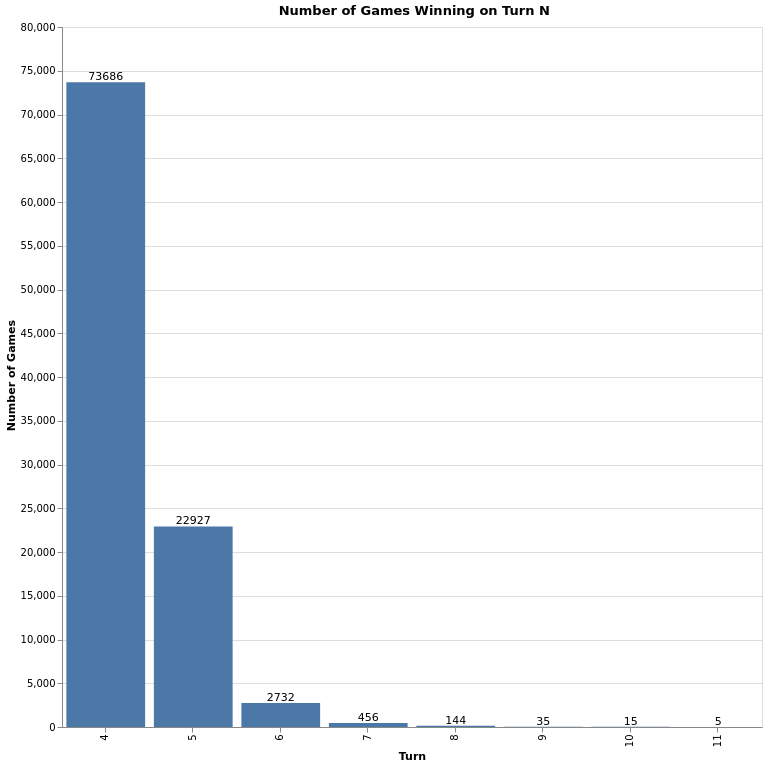

In [26]:
#Creating a simply bar plot describing the distribution of 100000 games.

bars = alt.Chart(df).mark_bar().encode(
    
    x=alt.X('Turns To Win:N',axis=alt.Axis(title='Turn')),
    y=alt.Y('count(Turns To Win):Q',axis=alt.Axis(title=' Number of Games'))
).properties(
    title=' Number of Games Winning on Turn N',
    width = 700,
    height = 700
)


text = bars.mark_text(
    align='center',
    baseline='bottom',
).encode(
    text='count(Turns To Win):Q'
)

bars + text

In [27]:
#Is this stable? Let's try it 5 times for 1000 games each.

win1 = [singleSimpleGame02() for i in range(0,1000)]
win2 = [singleSimpleGame02() for i in range(0,1000)]
win3 = [singleSimpleGame02() for i in range(0,1000)]
win4 = [singleSimpleGame02() for i in range(0,1000)]
win5 = [singleSimpleGame02() for i in range(0,1000)]

df02 = pd.DataFrame({
    'Series 1': win1,
    'Series 2': win2,
    'Series 3': win3,
    'Series 4': win4,
    'Series 5': win5
})


In [28]:
df02

,Series 1,Series 2,Series 3,Series 4,Series 5
0,4,4,5,4,5
1,5,4,4,6,5
2,4,4,4,5,4
3,4,5,4,4,5
4,4,4,4,5,4
5,4,5,4,5,4
6,4,4,5,4,4
7,4,4,4,5,4
8,4,4,4,4,4
9,5,5,4,4,4


In [29]:
#One way to TIDY (3 conditions met for data to be tidy) is to simply stack
df03 = df02.stack()
df03

0    Series 1    4
     Series 2    4
     Series 3    5
     Series 4    4
     Series 5    5
1    Series 1    5
     Series 2    4
     Series 3    4
     Series 4    6
     Series 5    5
2    Series 1    4
     Series 2    4
     Series 3    4
     Series 4    5
     Series 5    4
3    Series 1    4
     Series 2    5
     Series 3    4
     Series 4    4
     Series 5    5
4    Series 1    4
     Series 2    4
     Series 3    4
     Series 4    5
     Series 5    4
5    Series 1    4
     Series 2    5
     Series 3    4
     Series 4    5
     Series 5    4
                ..
994  Series 1    4
     Series 2    4
     Series 3    5
     Series 4    4
     Series 5    4
995  Series 1    4
     Series 2    4
     Series 3    5
     Series 4    5
     Series 5    4
996  Series 1    4
     Series 2    5
     Series 3    4
     Series 4    4
     Series 5    5
997  Series 1    4
     Series 2    4
     Series 3    5
     Series 4    4
     Series 5    4
998  Series 1    4
     Series 

In [31]:
#While stacking appears nicer, melting the data works much better
meltedDf = pd.melt(df02)
meltedDf = meltedDf.rename(columns={'variable':'Which Series', 'value':'turn'})
meltedDf

,Which Series,turn
0,Series 1,4
1,Series 1,5
2,Series 1,4
3,Series 1,4
4,Series 1,4
5,Series 1,4
6,Series 1,4
7,Series 1,4
8,Series 1,4
9,Series 1,5


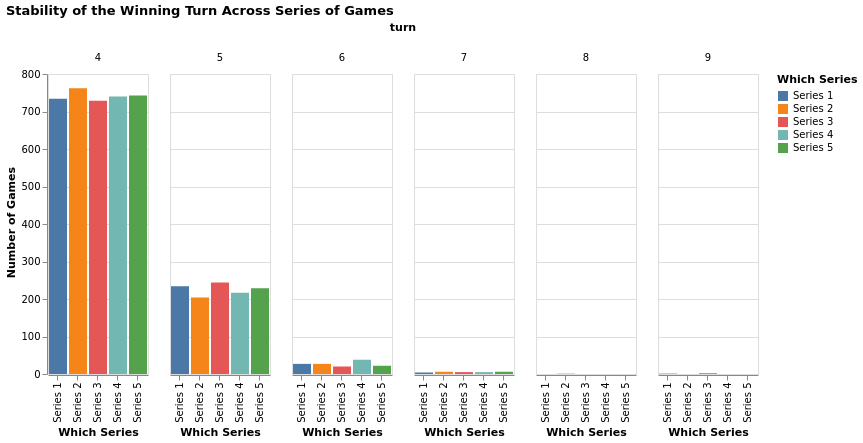

In [32]:

alt.Chart(meltedDf).mark_bar().encode(
    x='Which Series:O',
    y=alt.Y('count(turns):Q', axis=alt.Axis(title=' Number of Games')),
    color='Which Series:N',
    column='turn:N'
).properties (
title = 'Stability of the Winning Turn Across Series of Games'
)



In [38]:
#The mean turn taking a 'large' amount of games

print("Taking 100,000 games, the mean winning turn is:",np.mean(winningTurnArray))

Taking 100,000 games, the mean winning turn is: 4.30635


In [44]:
#The mean of each of the Series by applying a grouping aggregation.
#The mean also seems to gober about 4.3 which, with the above visualization, is a decent indication of stability across distributions.

groupedAgg = meltedDf.groupby('Which Series')
groupedAgg.mean()

,turn
Which Series,
Series 1,4.305
Series 2,4.280
Series 3,4.309
Series 4,4.308
Series 5,4.291


In [43]:
#We can aggregate the data to visualize it more clearly than a simple stack.
#Here we see the top 5 games of each Series.

def top(df, n=5, column='turn'):
    return df.sort_values(by=column)[-n:]

groupedAgg.apply(top)

Which Series  turn
Which Series                        
Series 1     350      Series 1     7
             707      Series 1     7
             781      Series 1     7
             67       Series 1     7
             407      Series 1     9
Series 2     1664     Series 2     7
             1090     Series 2     7
             1273     Series 2     7
             1241     Series 2     7
             1113     Series 2     8
Series 3     2359     Series 3     7
             2915     Series 3     7
             2127     Series 3     7
             2425     Series 3     9
             2499     Series 3     9
Series 4     3720     Series 4     7
             3786     Series 4     7
             3472     Series 4     7
             3747     Series 4     7
             3923     Series 4     7
Series 5     4273     Series 5     7
             4383     Series 5     7
             4226     Series 5     7
             4379     Series 5     7
             4556     Series 5     7

## Comments On V1.0

1. Data (Brief initial Observations)
    1. Mean won turn is ~4.3 and by far most games are won on turn 4.
    2. Seem fairly stable (didn't see vastly different distributions across Series)
    3. There weren't ANY games that won as soon as turn 3...with abilities, will this change?

We now have a function that can tell how many turns a particular deck with power and costs can win. However, there are SEVERAL ways to <b>improve</b> this:

1. Card Types
    1. Enchantments, Sorceries, Instants, so on...
    2. ABILITIES. Cards have abilities!
2. Lands
    1. Playing lands
    2. Color of lands
3. Board State
    1. We don't consider if the opponent has blockers. This will be difficult to implement...so I don't intend to
4. Optimize Computational Complexity
5. No AI/Machine Learning (I don't want to anyhow; unneccesarily difficult to collect data) 

Let's see if I can resolve issues 1A, 1B and 2A by using some object oriented programming to implement classes/objects for the cards.

# MTG Algorithm V2.0: Game Class and Card Objects <a class="anchor" id="3-bullet"></a> #

In [3]:
#I choose a budget red deck for simplicty's sake. 
#Interaction with the opponent is tricky to mimic even with machine learning, so some cards that benefit from such conditions are omitted.

class MTGGame():
    
    def __init__(self, deck, turn = 0, mana = 0, lifeTotal = 20, hand = [], board = [], cavalcadeCount = 0):
        # turn - the turn in the game (int)
        # mana - the amount of mana on a turn (int)
        # lifeTotal - the total life of the opponent (int)
        # deck - the deck of MTGCard objects (list)
        # hand - the MTGCard objects in hand (list)
        # board - the MTGCard objects in play (list)
        # cavalcadeCount - the number of Cavalcade of Calamity played (main card of the deck) (int)
        # birdCount was simply to simplify a certain cardTrigger without the use of decorators (int)
        
        self.turn = turn
        self.mana = mana
        self.lifeTotal = lifeTotal
        self.deck = deck
        self.hand = hand
        self.board = board
        self.permDeck = deck[:]
        
        self.cavalcadeCount = cavalcadeCount
        self.birdCount = 0
        self.damageWasDealt = False
        
    #getter and setter functions
    def getTurn(self):
        return self.turn

    def getMana(self):
        return self.mana

    def getCardType(self):
        return self.lifeTotal
    
    def getDeck(self):
        return self.deck
    
    def getHand(self):
        return self.hand
    
    def getHandNames(self):
        for i in range(len(self.hand)):
            print(self.hand[i].getName())
    
    def getBoard(self):
        return self.board
    
    def getBoardNames(self):
        for i in range(len(self.board)):
            print(self.board[i].getName())
    
    def resetGame(self):
        #Resets the Game
        #NOTE: We use [:] on self.permDeck because the Slice is a faster than deepCopy. This is so the '=' is not strictly a pointer (permDeck not changed with deck)
        self.turn = 0
        self.mana = 0
        self.lifeTotal = 20
        self.deck = self.permDeck[:] #This does not exist until we create the deck from the MTGCard() class.
        self.hand = []
        self.board = []
        
        self.cavalcadeCount = 0
        self.birdCount = 0
        self.damageWasDealt = False
        
    def initAgain(self, deck, turn = 0, mana = 0, lifeTotal = 20, cavalcadeCount = 0, hand = [], board = []):
        #Allows me to reinitialize the instance. This allows me to mutate any attribute as I like WITHOUT changing the instance id!
        self.turn = turn
        self.mana = mana
        self.lifeTotal = lifeTotal
        self.cavalcadeCount = cavalcadeCount
        self.deck = deck
        self.hand = hand
        self.board = board
        self.permDeck = deck[:]
    
    def shuffleDeck(self):
        #Shuffles the Card Objects in the deck
        rand.shuffle(self.deck)
    
    def searchCard(self, iterable):
        index = 0
        for element in iterable:
            if element:
                return (index)
            index = index+1
        return (np.nan)
    
    
    def combinedSearch(self, inputCardType, inputCMC = np.nan, inputList = None):
        """
        Input: A cardType (string)
        Output: Returns the index of the first card with the input cardType; returns np.nan if no index
        Funtionality: Same as output
        Limitation: Is FIRST Index that satisfies conditions
        """
        
        #We don't need to use update kwargs; there's only 3 input  to consider
        if(inputList == 'hand'):
            inputList = self.hand
        elif(inputList == 'deck'):
            inputList = self.deck
        elif(inputList == 'board'):
            inputList = self.board
        else:
            inputList = self.hand
        
        """
        #Used to verify the function:
        for card in inputList:
            print("card.CMC,inputCMC:",card.CMC, inputCMC, (card.CMC is inputCMC))
        """
        
        
        if (inputCMC is np.nan):
            return self.searchCard((card.cardType == inputCardType and card.CMC is inputCMC) for card in inputList)
        else:
            return self.searchCard((card.cardType == inputCardType and card.CMC == inputCMC) for card in inputList)
        
    
    def playCard(self, inputCardType, inputCMC = np.nan):
        """
        Input: A card type you wish to play to the board (string)
        Output: None (No return)
        Functionality: Finds the first card in hand with type inputCardType and plays it to the board
        Limitation: Finds the FIRST card that satisfies type condition
        """
        
        #Finds the first index in hand that has the given type and CMC (if granted)
        
        #These additional lines are specific to this deck and Runaway Steam-Kin:
        if(inputCardType is not "Land"):
            for card in self.board:
                
                if(card.name == 'Runaway Steam-Kin'):
                    card.power = card.power + 1
        
        #Here we search for the index of the card with the given input type
        handIndex = self.combinedSearch(inputCardType, inputCMC, 'hand')
        
        #Finds the card at the index
        cardToPlay = self.hand[handIndex]
        
        #print("cardToPlay:",cardToPlay.getName())
        
        #Plays it to the board and pops it off from hand
        self.board.append(cardToPlay)
        self.hand.pop(handIndex)
        
        manaCast = cardToPlay.getCMC()
        
        #subtract off the mana of the card
        self.mana = self.mana - manaCast
        
    
    def drawCard(self):
        """
        Input: None
        Output: None (Returns the top card from deck, but that's not it's functionality)
        Functionality: Moves the top/last card from self.deck to self.hand
        """
        #Puts the top card from the deck into hand
        self.hand.append( self.deck[-1])
        
        #Pops off the top card from the deck (STACK)
        self.deck.pop()
        
    def singleTurn(self):
        """
        Input: None
        Output: None (Returns nothing)
        Functionality: Plays out a single turn for a MTGGame object. Is the central deciding logic to the algorithm.
        Limitation: Limited to specification. Simply carries out logic. Plays land, Cavalcade, creatures, attacks if able, sorceries, ends turn.
        """
            
        # Beginning phase: Iterate turn, Draw a card, plays a land, evaluates mana 
            
        self.turn = self.turn + 1
        self.drawCard()
        
        
        #Searches hand. If non nan (from combined search), then plays land
        if(not(np.isnan(self.combinedSearch('Land')))):
            self.playCard('Land')
            
        self.mana = sum(card.cardType == 'Land' for card in self.board)
        
        
        #Prioritizing the play of Calvacade of Calamity
        for card in self.hand:
            if( self.mana >= 2):
                if (card.cardType == 'Enchantment'):
                    self.playCard('Enchantment', 2)
                    self.cavalcadeCount = self.cavalcadeCount + 1
        
        #The idea is to check if I have 3 mana. If I have the Spitfire, That's more important. If I have chandra but NO spitfire, then I'll play Chandra before other creatures.
        if(self.mana >=3):
            
            global spitfireInHand
            
            for card in self.hand:
                if(card.name == "Chandra's Spitfire"):
                    spitfireInHand = True
                    break
                else:
                    spitfireInHand = False
                    
                
            if(spitfireInHand == False):
                for card in self.hand:
                    if(card.name == 'Chandra, Acolyte of Flame'):
                        chandraInHand = True
                        self.playCard('Planeswalker', 3)
                        break
                    else:
                        chandraInHand = False
        
        #Plays creatures in 1st main
        canPlayCards = True
        while(canPlayCards):
            
            maxCMC = self.findMaxHandCreatureCMC()
            
            if (maxCMC != 0 and maxCMC is not np.nan):
                
                minCMC = self.findMinHandCreatureCMC()
            
                if (self.mana == maxCMC):
                    
                    self.playCard('Creature', maxCMC)
                    canPlayCards = False
            
                elif(self.mana > maxCMC):
                    
                
                    self.playCard('Creature', maxCMC)
                    
                    
                    
                elif(self.mana < maxCMC and self.mana >= minCMC):
                    
                    manaCountDown = self.mana
                    
                    for i in range(self.mana, 0, -1):
                        manaCountDown = i #I could use manaCountDown directly, but this is real clear how we are counting down
                        
                        handCMCs = [card.CMC for card in self.hand if card.cardType == 'Creature']
                        
                        if(manaCountDown in handCMCs):
                            if (self.mana > 0):
                                self.playCard('Creature', manaCountDown)
                                
                            
                else:
                    canPlayCards = False
                    
            else:
                canPlayCards = False
                            
                    
        
        #Attacking Phase
        
        #Please note that I left in the prints as a way to troubleshoot and test; but in a final product these would of course be removed.
    
        #print("Combat phase for turn:", self.turn)
        #print("Starting lifeTotal:",self.lifeTotal)
        
        #1 - Attacking Triggers
        
        for card in self.board:
            if(card.canAttack == True):
                card.attackingAbility()
        
        
        #print("lifetotal after ability Triggers:",self.lifeTotal)
        
        #2 - Cavalcade
        for card in self.board:
            if(card.cardType == 'Creature' and card.power == 1 and card.canAttack == True):
                for i in range(self.cavalcadeCount):
                    self.dealDamage(1)
                    self.birdCount = self.birdCount + 3
        
        #print("lifetotal after cavalcade:",self.lifeTotal)
        
        #3 - The Bird is the Word
        
        for card in self.board:
            
            if(card.name == "Chandra's Spitfire"):
                
                card.power = card.power + self.birdCount
        
        
        #4 - Combat Damage
        for card in self.board:
            if(card.cardType == 'Creature' and card.canAttack == True):
                
                self.dealDamage(card.power)
        
        #print("lifeTotal after combat damage :",self.lifeTotal)
        
        #5 - End Phase; reseting 'until end of turn' effects
        #Reset powers
        self.birdCount = 0
        for card in self.board:
            if(card.name == "Chandra's Spitfire"):
                card.power = 1
                
            elif(card.name == "Fervent Champion"):
                card.power = 1
        
        #Clear out those elemental tokens Chandra made:
        tokenCount = 0
        for card in self.board:
            if (card.name == "Elemental Token"):
                tokenCount = tokenCount + 1
        
        if (tokenCount > 0):
            # While self.board = self.board[:-tokenCount] is faster; but it creates a deep copy of the board.
            for popCount in range(tokenCount):
                self.board.pop()
        
        
        
        #Setting creatures to be able to attack for the next turn who don't have haste (This actually is a problem for the Spitfire; but I could implement something better given time)
        for card in self.board:
            if (card.canAttack == False and card.cardType == 'Creature'):
                card.canAttack = True
                card.attackChange = True
    
    
    
        #Casting Light Up The Stage at the end of the turn if damage was dealt
        if(self.damageWasDealt == True and self.mana > 0):
            for card in self.hand:
                if (card.name == 'Light Up the Stage'):
                    card.castedAbility()
                    self.mana = self.mana - 1
        
        
        #print("end of combat phase for turn:",self.turn)   

    def dealDamage(self,damageDealt):
        """ Deals Damage"""
        for card in self.board:
            if (card.name == 'Torbran, Thane of Red Fell'):
                TobranOnBoard = True
            else:
                TobranOnBoard = False
        
        if (TobranOnBoard == False):
            self.lifeTotal = self.lifeTotal - damageDealt
        else: 
            self.lifeTotal = self.lifeTotal - (damageDealt + 2)
        
        self.damageWasDealt = True
    
    
    def findMaxHandCreatureCMC(self):
        """
        Input: None.
        Output: Returns maxCMC of Creature in hand.
        Functionality:  Returns maxCMC of Creature in hand.
        Notes: This method is to make singleTurn() more readable since I find the max CMC of a creature often.
        """
        
        creatureHandList = [card.CMC for card in self.hand if card.cardType == 'Creature']
        
        if (len(creatureHandList) > 0):
            maxCMC = np.nanmax(creatureHandList)
        else:
            maxCMC = np.nan
        return maxCMC
    
    def findMinHandCreatureCMC(self):
        
        creatureHandList = [card.CMC for card in self.hand if card.cardType == 'Creature']
        
        if (len(creatureHandList) > 0):
            minCMC = np.nanmin(creatureHandList)
        else:
            minCMC = np.nan
        return minCMC
    
    
    def singleGame(self):
        """
        Input: None
        Output: Returns the number of turns it took to win.
        Functionality: Plays out a game of MTGGame (until opposing lifeTotal <= 0)
        Limitation: Limited to specification. Simply carries out logic.
        """
            
        #Starting a new game
        calvacadeCount = 0
        self.resetGame()
        self.shuffleDeck()
            
        #drawing seven cards at start of game
        for x in list(range(7)):
            self.drawCard()
            
            
        #Implement singleTurns until lifeTotal = 0
        while(self.lifeTotal > 0):
            self.singleTurn()
        
        
        #Here I reset the power for the Runaway Steamkins
        for card in self.board:
            
            if(card.name == 'Runaway Steam-Kin'):
                card.power = 1
            
            if(card.attackChange == True):
                card.canAttack = False
        
        return(self.turn,self.cavalcadeCount)
    

In [4]:
#Should consider inheritance and splitting the cards
class MTGCard():
    # name: Name of the Card (string)
    # CMC: Converted Mana Cost (We are ignoring colors for now) (int)
    # cardType - Creature, Enchantment, Instant, Sorcery, Land (string)
    # power: It's Power (int)
    # toughness - It's Toughness - int
    # castedAbility - Ability Function - the ability it has when casted (function)
    # attackingAbility - Ability Function - the ability it attacks (function)
    # activatedAbility - Ability Function - the ability that occurs when triggered or casted (function)
    
    #I should really make a planeswalker super() subclass that INHERITS these, but instead I just give it the most relevant ability for our task
    #And that wouuld have the activated ability
    
    def __init__(self, name, CMC, cardType, power, toughness, _castedAbility, _attackingAbility, canAttack = False, attackChange = False):
        self.name = name
        self.CMC = CMC
        self.cardType = cardType
        self.power = power
        self.toughness = toughness
        self.castedAbility = _castedAbility
        self.attackingAbility = _attackingAbility
        self.canAttack = canAttack
        self.attackChange = attackChange
    
    #Getter functions; redundant in Python but good reminder for Java
    def getName(self):
        return self.name
    
    def getCMC(self):
        return self.CMC
    
    def getCardType(self):
        return self.cardType
    
    def getPower(self):
        return self.power

    def getToughness(self):
        return self.toughness
    
    def getName(self):
        return self.name
    
    def getCastedAbility(self):
        return self.castedAbility
    
    def getAttackingAbility(self):
        return self.attackingAbility
    
    def getActivatedAbility(self):
        return self.activatedAbility
    
    def getCanAttack(self):
        return self.canAttack


In [5]:
class AbilityList():
        #Rename them with camelCase!!!
        
    def __init__(self):
        self.owner = None
    """
    def method1(self):
        self.owner.add(2)
        #return self.owner.add(2)
    def method2(self):
        self.owner.subtract(1)
        #return self.owner.subtract(1)
    """  
        
    
    def nullAbility(self):
        #A null ability parameter, when called, does nothing.
        return
        
        
    def scorchAttackingAbility(self):
        # Whenever Scorch Spitter attacks, it deals 1 damage to the player or planeswalker it's attacking.
        
        self.owner.dealDamage(1)
        self.owner.birdCount = self.owner.birdCount + 1
        
        
    def FerventAttackingAbility(self):
        #Whenever Fervent Champion attacks, another target attacking Knight you control gets +1/+0 until end of turn. Haste.
        
        #I am ommiting first strike, since I'm not worried about blockers yet
        #I am ommitting the equip ability since I don't want to deal with Embercleave right now.
        #For this to trigger, there need to be two or more. Thus, I can simply ping 1 damage instead.
        FervantChampionFlag = 0
        for card in self.owner.board:
            if (card.name == 'Fervent Champion'):
                FervantChampionFlag = FervantChampionFlag + 1
        if (FervantChampionFlag >=2):
            self.owner.dealDamage(1)
        
        
    def LightUpTheStageCastedAbility(self):
        self.owner.drawCard()
        self.owner.drawCard()
        
    def ChandraActivatedAbility(self):
        
        elementalTokenOne = MTGCard('Elemental Token', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility, True)
        elementalTokenTwo = MTGCard('Elemental Token', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility, True)
        
        self.owner.board.append(elementalTokenOne)
        self.owner.board.append(elementalTokenTwo)

#Still need to work out haste!

In [6]:
monoRedDeck = MTGGame([])
al = AbilityList()

al.owner = monoRedDeck

In [7]:
#What I ended up using for the deckList

#Creatures
ScorchSpitter1 = MTGCard('Scorch Spitter', 1, 'Creature', 1, 1, al.nullAbility,al.scorchAttackingAbility)
ScorchSpitter2 = MTGCard('Scorch Spitter', 1, 'Creature', 1, 1, al.nullAbility,al.scorchAttackingAbility)
ScorchSpitter3 = MTGCard('Scorch Spitter', 1, 'Creature', 1, 1, al.nullAbility,al.scorchAttackingAbility)
ScorchSpitter4 = MTGCard('Scorch Spitter', 1, 'Creature', 1, 1, al.nullAbility,al.scorchAttackingAbility)

FerventChampion = MTGCard('Fervent Champion', 1, 'Creature', 1, 1, al.nullAbility,al.FerventAttackingAbility, True)

TinStreetDodger1 = MTGCard('Tin Street Dodger', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
TinStreetDodger2 = MTGCard('Tin Street Dodger', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
TinStreetDodger3 = MTGCard('Tin Street Dodger', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
TinStreetDodger4 = MTGCard('Tin Street Dodger', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)

FootlightFiend1 = MTGCard('Footlight Fiend', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
FootlightFiend2 = MTGCard('Footlight Fiend', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
FootlightFiend3 = MTGCard('Footlight Fiend', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
FootlightFiend4 = MTGCard('Footlight Fiend', 1, 'Creature', 1, 1, al.nullAbility,al.nullAbility)

#I made these seperate so card.power is different for each
RunawaySteamKin1 = MTGCard('Runaway Steam-Kin', 2, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
RunawaySteamKin2 = MTGCard('Runaway Steam-Kin', 2, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
RunawaySteamKin3 = MTGCard('Runaway Steam-Kin', 2, 'Creature', 1, 1, al.nullAbility,al.nullAbility)
RunawaySteamKin4 = MTGCard('Runaway Steam-Kin', 2, 'Creature', 1, 1, al.nullAbility,al.nullAbility)

ChandrasSpitfire = MTGCard("Chandra's Spitfire", 3, 'Creature', 1, 3, al.nullAbility,al.nullAbility)


Torbran = MTGCard('Torbran, Thane of Red Fell', 4, 'Creature', 2, 4, al.nullAbility,al.nullAbility)

#THE Enchantment
CavalcadeOfCalamity = MTGCard('Cavalcade of Calamity', 2, 'Enchantment', np.nan, np.nan, al.nullAbility,al.nullAbility)

#Sorcery
LightUpTheStage = MTGCard('Light Up the Stage', 3, 'Sorcery', np.nan, np.nan, al.LightUpTheStageCastedAbility,al.nullAbility)

#Planeswalker/Sorcery
Chandra = MTGCard('Chandra, Acolyte of Flame', 3, 'Planeswalker', np.nan, np.nan, al.nullAbility,al.ChandraActivatedAbility)

#Lands
Mountain = MTGCard('Mountain', np.nan, 'Land', np.nan, np.nan, al.nullAbility,al.nullAbility)
CastleEmbereth =  MTGCard('CastleEmbereth', np.nan, 'Land', np.nan, np.nan, al.nullAbility,al.nullAbility)


deckList = []

#Constructing the deck. I do so in this way so the cards are neatly organized.

#Creatures; ascending CMC

deckList.append(ScorchSpitter1)
deckList.append(ScorchSpitter2)
deckList.append(ScorchSpitter3)
deckList.append(ScorchSpitter4)

for i in range(4):
    deckList.append(FerventChampion)
    
deckList.append(TinStreetDodger1)
deckList.append(TinStreetDodger2)
deckList.append(TinStreetDodger3)
deckList.append(TinStreetDodger4)

deckList.append(FootlightFiend1)
deckList.append(FootlightFiend2)
deckList.append(FootlightFiend3)
deckList.append(FootlightFiend4)

deckList.append(RunawaySteamKin1)
deckList.append(RunawaySteamKin2)
deckList.append(RunawaySteamKin3)
deckList.append(RunawaySteamKin4)

for i in range(4):
    deckList.append(ChandrasSpitfire)
for i in range(3):
    deckList.append(Torbran)
    
#Non-Creatures; ascending CMC
    
for i in range (4):
    deckList.append(CavalcadeOfCalamity)
for i in range (4):
    deckList.append(LightUpTheStage)
for i in range (4):
    deckList.append(Chandra)

#Lands
for i in range(4):
    deckList.append(CastleEmbereth)
for i in range(17):
    deckList.append(Mountain)

len(deckList)

60

In [8]:
#Verifying our deck looks correct
for i in range(0,len(deckList)-40):
    print(deckList[i].getName())

Scorch Spitter
Scorch Spitter
Scorch Spitter
Scorch Spitter
Fervent Champion
Fervent Champion
Fervent Champion
Fervent Champion
Tin Street Dodger
Tin Street Dodger
Tin Street Dodger
Tin Street Dodger
Footlight Fiend
Footlight Fiend
Footlight Fiend
Footlight Fiend
Runaway Steam-Kin
Runaway Steam-Kin
Runaway Steam-Kin
Runaway Steam-Kin


In [9]:
monoRedDeck.initAgain(deckList)

In [10]:
monoRedDeck.resetGame()

In [185]:
monoRedDeck.singleGame()

cardToPlay: Mountain
cardToPlay: Scorch Spitter
Combat phase for turn: 1
Starting lifeTotal: 20
lifetotal after cavalcade: 20
lifeTotal after combat damage : 20
end of combat phase for turn: 1
cardToPlay: Mountain
cardToPlay: Footlight Fiend
Combat phase for turn: 2
Starting lifeTotal: 20
lifetotal after cavalcade: 19
lifeTotal after combat damage : 18
end of combat phase for turn: 2
cardToPlay: Mountain
cardToPlay: Cavalcade of Calamity
cardToPlay: Footlight Fiend
Combat phase for turn: 3
Starting lifeTotal: 18
lifetotal after cavalcade: 15
lifeTotal after combat damage : 13
end of combat phase for turn: 3
cardToPlay: Mountain
cardToPlay: Chandra's Spitfire
cardToPlay: Footlight Fiend
Combat phase for turn: 4
Starting lifeTotal: 13
lifetotal after cavalcade: 9
lifeTotal after combat damage : 6
end of combat phase for turn: 4
cardToPlay: Mountain
cardToPlay: Chandra's Spitfire
cardToPlay: Runaway Steam-Kin
Combat phase for turn: 5
Starting lifeTotal: 6
lifetotal after cavalcade: -1
lif

5

In [11]:
monoRedDeck.getBoardNames()

In [187]:
monoRedDeck.getHandNames()

Light Up the Stage
Light Up the Stage
Tin Street Dodger


In [22]:
#I can add in the prints if I want to see how the game played out
monoRedDeck.singleGame()

(4, 1)

In [46]:
monoRedDeck.getTurn(),monoRedDeck.getMana(), monoRedDeck.lifeTotal

(4, 1, 0)

# MTG Algorithm V2.0: Simple Exploratory Analysis <a class="anchor" id="4-bullet"></a> #

I start this analysis nearly identically to the prior. I am interested in seeing if my results are more typical of an actual game, and if our classes improved our estimation on how fast we expect to win.


In [2]:
winningTurnList = []
cavalcadeList = []

for i in range(100000):
    
    winningTurn,cavalcadeNum = monoRedDeck.singleGame()
    
    winningTurnList.append(winningTurn)
    cavalcadeList.append(cavalcadeNum)
    


NameError: name 'monoRedDeck' is not defined

In [29]:
df = pd.DataFrame({
    'Turns To Win': winningTurnList,
    'Cavalcade Count': cavalcadeList
})

In [31]:
df[0:10]

,Turns To Win,Cavalcade Count
0,4,2
1,5,0
2,4,1
3,6,1
4,5,1
5,6,0
6,5,0
7,6,0
8,5,0
9,6,0


In [33]:
#This saving technique is specific to my computer.

df.to_csv(r'/home/marco/Desktop/Class Py Programming/Personal Projects/MTG and Data Algorithm/mtgData.csv')

In [3]:
#This is also specific to me (reloading the dataset)

mtgData = pd.read_csv('mtgData.csv')
df = mtgData
df = df.drop('Unnamed: 0', axis = 1)

In [4]:
#Some initial Summary Statistics
df.describe()

,Turns To Win,Cavalcade Count
count,100000.000000,100000.000000
mean,5.286300,0.886220
std,0.930291,0.791935
min,4.000000,0.000000
25%,5.000000,0.000000
50%,5.000000,1.000000
75%,6.000000,1.000000
max,18.000000,4.000000


In [5]:
#Allowing a large dataset for altair.
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [6]:
#This describes the distribution of wins over 100,000 games

bars = alt.Chart(df).mark_bar().encode(
    
    x=alt.X('Turns To Win:N',axis=alt.Axis(title='Turn')),
    y=alt.Y('count(Turns To Win):Q',axis=alt.Axis(title=' Number of Games'))
).properties(
    title=' Number of Games Winning on Turn N',
    width = 700,
    height = 700
)

text = bars.mark_text(
    align='center',
    baseline='bottom',
).encode(
    text='count(Turns To Win):Q'
)

bars + text

alt.LayerChart(...)

In [7]:
alt.Chart(df).mark_bar().encode(
    x='Turns To Win:O',
    y=alt.Y('count(turns):Q', axis=alt.Axis(title='Number of Games')),
    color='Cavalcade Count:N',
    column='Cavalcade Count:N'
).properties (
title = 'Won Games versus Cavalcade Count'
)

alt.Chart(...)

In [8]:
alt.Chart(df).mark_bar(opacity=0.8).encode(
    x='Turns To Win:O',
    y=alt.Y('count(turns):Q', axis=alt.Axis(title='Number of Games'), stack = None),
    color='Cavalcade Count:N',
).properties (
title = 'Won Games versus Cavalcade Count Layered'
)

alt.Chart(...)

In [9]:
#Is this stable? Let's try it 5 times for 1000 games each.

win1 = [monoRedDeck.singleGame()[0] for i in range(0,1000)]
win2 = [monoRedDeck.singleGame()[0] for i in range(0,1000)]
win3 = [monoRedDeck.singleGame()[0] for i in range(0,1000)]
win4 = [monoRedDeck.singleGame()[0] for i in range(0,1000)]
win5 = [monoRedDeck.singleGame()[0] for i in range(0,1000)]

df02 = pd.DataFrame({
    'Series 1': win1,
    'Series 2': win2,
    'Series 3': win3,
    'Series 4': win4,
    'Series 5': win5
})

NameError: name 'monoRedDeck' is not defined

In [37]:
#This saving technique is specific to my computer.

df02.to_csv(r'/home/marco/Desktop/Class Py Programming/Personal Projects/MTG and Data Algorithm/mtgData02.csv')

In [10]:
#This is also specific to me (Loading in a prior saved dataset)

mtgData02 = pd.read_csv('mtgData02.csv')
df02 = mtgData02.drop('Unnamed: 0', axis = 1)
df02[0:10]

,Series 1,Series 2,Series 3,Series 4,Series 5
0,6,9,6,5,5
1,5,5,5,6,4
2,5,5,5,5,5
3,6,5,5,4,4
4,4,5,5,6,4
5,6,5,4,5,4
6,5,5,5,5,6
7,4,4,5,5,6
8,6,6,5,4,5
9,5,5,5,5,5


In [11]:
meltedDf = pd.melt(df02)
meltedDf = meltedDf.rename(columns={'variable':'Which Series', 'value':'turn'})
meltedDf

,Which Series,turn
0,Series 1,6
1,Series 1,5
2,Series 1,5
3,Series 1,6
4,Series 1,4
...,...,...
4995,Series 5,6
4996,Series 5,4
4997,Series 5,5
4998,Series 5,6


In [12]:
print("Taking 100,000 games, the mean winning turn is:",np.mean(mtgData['Turns To Win']))

Taking 100,000 games, the mean winning turn is: 5.2863


In [13]:
groupedAgg = meltedDf.groupby('Which Series')
groupedAgg.mean()

,turn
Which Series,
Series 1,5.274
Series 2,5.301
Series 3,5.279
Series 4,5.262
Series 5,5.271


In [14]:
alt.Chart(meltedDf).mark_bar().encode(
    x='Which Series:O',
    y=alt.Y('count(turns):Q', axis=alt.Axis(title=' Number of Games')),
    color='Which Series:N',
    column='turn:N'
).properties (
title = 'Stability of the Winning Turn Across Series of Games'
)

alt.Chart(...)

In [15]:
alt.Chart(meltedDf).mark_bar().encode(
    x='Which Series:O',
    y=alt.Y('count(turns):Q', axis=alt.Axis(title=' Number of Games')),
    color='Which Series:N',
    column='turn:N'
).properties (
title = 'Stability of the Winning Turn Across Series of Games'
)

alt.Chart(...)

In [16]:
base = alt.Chart(babyData).transform_filter(
    'datum.smoke != 9'
)

#Here we create the histograms; color implicitly layers the histograms sorted by what is encoded in it
histograms = base.mark_bar(opacity=0.6).encode(
    alt.X("turn:Q",title='Birth Weight (Ounces)', bin=alt.Bin(extent=[60, 180], step=10)),
    alt.Y('count()', title='Count Of Observations'),
    color='Which Series:N'
).properties(
title=' Histograms of Baby Weights Of Mothers who Smoke Vs. Not',

)



NameError: name 'babyData' is not defined

In [24]:
meltedDf

,Which Series,turn
0,Series 1,6
1,Series 1,5
2,Series 1,5
3,Series 1,6
4,Series 1,4
...,...,...
4995,Series 5,6
4996,Series 5,4
4997,Series 5,5
4998,Series 5,6


### Some Things I Learned (To Myself) ###


These are notes about what I learned or what particuarly interested me. Please skip these if you are interested in the data. This is a lengthy read, and intended for my personal learning, so *please* don't bother, hah!

1. The Data LifeCycle
</br>
This was particuarly easy given the circumstance, but I was happy to pursue this faithfully. I had an initial question "How fast, by turn count, can a particular red deck with particular conditions, win?" With this question, I attempted a (VERY) rough starting attempt, cleaned the data, and have the results of Simple MTG Data - Naive Game (link this). Of course, my conditions were terrible, and so were the code! So I returned to my Q, made the conditions better, and tried to produce new data with a better question! Fairly simple, but is appropriate.


2. 'Top Down' versus 'Bottom Up'
</br>
I started 2.0 with a mostly 'Bottom up' approach. I seperated my MTGGame, MTGPlayer, and MTGCard with super() divisions like Creature, Planeswalker, and so forth. It was a neat approach and the idea was to make a general program for two players to play. This was far too ambitious and unneccesary for the task and time I had. Thus I pursued a more top down approach, simpy attempting to implement solutions to the problems I had ("how do I make X card work?") and so forth. I should keep both in mind and their advantages/disadvantages as I go forward.


3. Programming Tasks

    1. 'Polymorphism' (not exactly) for Object Methods
    My favorite piece of code was easily the following:

    ```
    for card in self.board:
        card.attackingAbility()
    ```
    Fairly simple, but this carries out the specific unique method from the AbilityList class, passed as a paramater method to MTGCard Class, to MUTATE attributes in MTGGAME class. Recall that each method in AbilityList may have its own unique method attachted to only some cards; so calling it by its specific name (for a general game) would be a difficult task otherwise.

    2. Classes as Attributes
    
    For AbilityList to access the MTGGame Class, I had to set self.owner = the class. Thus, I have to MAKE an instance of the class with an id in memory. self in MTGGame is the same as self.owner in AbilityClass thusly.
    
    3. Let Python Help You!
    
    I wanted to search my hand for the first card with a condition. Easy! However, I made it even easier, since I was aware of the built-in any() function by Python found [here](https://docs.python.org/3/library/functions.html#any). I abridged it to return the index for the specified condition, and return nan if the condition was not met. Additionally, I created a combined version (combinedSearch), to improve upon their built-in method.
    
    
    4. Object ids
    
    Obvious, but the implementation of Runaway SteamKin was much different than Chandra's Spitfire in many respects. One thing to note is that it *benefits* me for the SteamKin to be seperate objects with different ids, yet the Spitfire to be the same id. This was because adding/removing power to a Spitfire should affect all of them on the board similarly. However, in the case of the SteamKin, we only trigger its effect each time a card is played for THAT SPECIFIC STEAMKIN; not ALL SteamKins permanently.
    
    5. Piece By Piece
    
    Obvious, and everyone does this, but I seperated did each task one by one outside of my class, with seperate examples (like one provided below), and THEN implemented it. This helped me avoid a lot of heartache, I suspect.
    
    
4. Data Tasks







In [7]:
#This was the seperate construction I used to figure out how I could change the attribute 'mutateThis' from a general Method from generalMethods stored as a function paramater for ObjectClass.
# This was so I could simply call genObject.generalMethod(); and execute a sort of 'polymorphism' for the function! In this manner, each object's unique function is called with one general method name.


class ExampleClass:
    
    def __init__(self, listOfObjects, mutateThis = 20):
        self.listOfObjects = listOfObjects
        self.mutateThis = mutateThis
        self.permList = listOfObjects[:]
    
    def initAgain(self, listOfObjects, mutateThis = 20):
        self.listOfObjects = listOfObjects
        self.mutateThis = mutateThis
        self.permList = listOfObjects[:]
    
    def resetGame(self):
        self.listOfObjects = self.listOfObjects[:]
        self.mutateThis = 20
    
    def exampleTask(self):
        
        for genObject in self.listOfObjects:
            
            genObject.generalMethod()
            
            print(self.mutateThis)
        
        print(self.mutateThis)
            
    def add(self, amtAdded):
        print("life b4:",self.mutateThis)
        self.mutateThis = self.mutateThis + amtAdded
        print("life after:",self.mutateThis)
        
    def subtract(self, amtSubtracted):
        print("life b4:",self.mutateThis)
        self.mutateThis = self.mutateThis - amtSubtracted
        print("life after:",self.mutateThis)
        
        
class ObjectClass:
    
    def __init__(self, otherParams, _generalMethod):
        self.otherParams = otherParams
        self.generalMethod = _generalMethod
        
    def getGeneralMethod(self):
        return self.generalMethod
    
class generalMethods():
#I'd also like these to be able to call methods in ExampleClass as well,another challenge.
    
    
    def __init__(self):
        self.owner = None
    
    def method1(self):
        self.owner.add(2)
        #return self.owner.add(2)
    def method2(self):
        self.owner.subtract(1)
        #return self.owner.subtract(1)
    


In [9]:
example = ExampleClass([])


gM = generalMethods()
gM.owner = example


In [10]:
object1 = ObjectClass('Other params1', gM.method1)
object2 = ObjectClass('Other params2', gM.method2)

objectList = []

for i in range(30):
    objectList.append(object1)
    objectList.append(object2)

In [11]:
example.mutateThis

20

In [12]:
example.initAgain(objectList)
example.exampleTask()

life b4: 20
life after: 22
22
life b4: 22
life after: 21
21
life b4: 21
life after: 23
23
life b4: 23
life after: 22
22
life b4: 22
life after: 24
24
life b4: 24
life after: 23
23
life b4: 23
life after: 25
25
life b4: 25
life after: 24
24
life b4: 24
life after: 26
26
life b4: 26
life after: 25
25
life b4: 25
life after: 27
27
life b4: 27
life after: 26
26
life b4: 26
life after: 28
28
life b4: 28
life after: 27
27
life b4: 27
life after: 29
29
life b4: 29
life after: 28
28
life b4: 28
life after: 30
30
life b4: 30
life after: 29
29
life b4: 29
life after: 31
31
life b4: 31
life after: 30
30
life b4: 30
life after: 32
32
life b4: 32
life after: 31
31
life b4: 31
life after: 33
33
life b4: 33
life after: 32
32
life b4: 32
life after: 34
34
life b4: 34
life after: 33
33
life b4: 33
life after: 35
35
life b4: 35
life after: 34
34
life b4: 34
life after: 36
36
life b4: 36
life after: 35
35
life b4: 35
life after: 37
37
life b4: 37
life after: 36
36
life b4: 36
life after: 38
38
life b4: 3

In [17]:
#The old built-in any(): Searches through and returns true for the first index this occurs to PLAY the card
# I added an index counter and returned what I desired instead of true/false:

def searchCard(iterable):
    index = 0
    for element in iterable:
        if element:
            return (index)
        index = index+1
    return (np.nan)


In [18]:
#We have this whole line we need to carry out!? Nah, we can do better!
searchCard(card.cardType == "Creature" for card in deckList) 

0

In [19]:
searchCard(card.cardType == "Land" for card in deckList)

39

In [20]:
#CombinedSearch combines the two operations into one:

def combinedSearch(inputCardType):
    """
    Input: A cardType (string)
    Output: Returns the index of the first card with the input cardType
    Funtionality: Same as output
    Limitation: Is FIRST Index that satisfies conditions
    """

    return searchCard(card.cardType == inputCardType for card in deckList)
    
combinedSearch('Land')

39

In [48]:
#Oh, and methods are bounded, duh. Pretty cool, right?
ScorchSpitter.getAttackingAbility()

<bound method AbilityList.scorchAttackingAbility of <__main__.AbilityList object at 0x7fe89112bbd0>>

In [49]:
#And they're different because of blank versus ()! Monty Python we did it!
ScorchSpitter.getAttackingAbility

<bound method MTGCard.getAttackingAbility of <__main__.MTGCard object at 0x7fe890ed54d0>>

In [257]:
#Just a useful way to list out the attributes of an object (I used it earlier to verify generalMethod was None type)
for attr, value in example.listOfObjects[0].__dict__.items():
        print(attr, value)

otherParams This would be many other params1
generalMethod None


In [641]:
#This was a way suggested on stack exchange to access Player() attributes from the Card class. However, AbilityList helps immensely for reason 3.1 above... This was suggested to me via stackOverflow and I found it quite nice.
class Player():
    
    def __init__(self, deck, turn = 0, mana = 0, lifeTotal = 20, hand = [], board = []):
        # turn - the turn in the game (int)
        # mana - the amount of mana on a turn (int)
        # lifeTotal - the total life of the opponent (int)
        # deck - the deck of MTGCard objects (list)
        # hand - the MTGCard objects in hand (list)
        # board - the MTGCard objects in play (list)
        
        self.turn = turn
        self.mana = mana
        self.lifeTotal = lifeTotal
        self.deck = deck
        self.hand = hand
        self.board = board
        self.permDeck = deck[:]
        
    def gainLife(self, lifeGained):
        self.lifeTotal = self.lifeTotal + lifeGained
        
    def dealDamage(self, damageDealt):
        self.lifeTotal = self.lifeTotal - damageDealt
    
    def combat(self):
        
        for card in self.deck:
            #Abilities
            card.attackHeal()
            
    def settingOwnership(self):
        for card in self.deck:
            card.owner = self

In [642]:
class Card:
    def __init__(self, name, text, cost):
        self.name = name
        self.text = text
        self.cost = cost
        self.owner = None

class Creature(Card):
    def __init__(self, name, text, cost, power, toughness):
        Card.__init__(self, name, text, cost)
        self.power = power
        self.toughness = toughness
        
    def attackHeal(self):
        #This heals 2 life when attackers are called
        self.owner.gainLife(2) 

    def scorchSpitterAbility(self):
        #This deals one damage are called
        self.owner.dealDamage(1)

heraldOfFaith = Creature("Herald of Faith", "Flying, When this attacks, gain 2 life", 5, 4, 3)
scorchSpitter = Creature("Scorch Spitter", "When it attacks, it deals 1 damage to the opponent", 1, 1, 1)
#healersHawk.game = game
#healersHawk.owner = player1

In [50]:
#I made this to find the cmcs for the cards in hand that are creatures. I use this for a piece of code somewhere in the MTGGame class, but this generally is useful actually!
handCMCsTEST = [card.CMC for card in monoRedDeck.hand if card.cardType == 'Creature']
handCMCsTEST

[2, 1, 1]

In [3]:
#Personal Notes (lazy):
# I checked the computational time of numpy append versus list append (I Think lists are much faster)
# Issue is later on I need the minCMC and numpy becomes handy => V1.2

# So I could optimize V1.0 some bit ....but there's no point in doing so since V2.0 is much better. It was just a start!